<a href="https://colab.research.google.com/github/nthanhkhang/Digital-Image-Processing/blob/main/Lab08.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lab 08

Look at article in the reference link below to learn more about the steps to build a lane detection model using OpenCV and Python
Reference: Understanding Hough Transform With A Lane Detection Model (paperspace.com)

Test image:https://github.com/Nigama-oss/Lane-Detection/blob/master/lane.jpg?raw=true 

Test video: https://github.com/Nigama-oss/Lane-Detection/blob/master/test2.mp4?raw=true 


# Ex8.1 
Build the application to detect lane lines as in the article in the instructions. The input is the test video, the output is the corresponding video with lane lines marked in colors.

In [ ]:
!wget https://raw.githubusercontent.com/Nigama-oss/Lane-Detection/master/lane.jpg

--2021-12-14 07:44:02--  https://raw.githubusercontent.com/Nigama-oss/Lane-Detection/master/lane.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 776021 (758K) [image/jpeg]
Saving to: ‘lane.jpg.6’

lane.jpg.6          100%[===================>] 757.83K  --.-KB/s    in 0.05s   

2021-12-14 07:44:02 (15.5 MB/s) - ‘lane.jpg.6’ saved [776021/776021]

--2021-12-14 07:45:46--  https://raw.githubusercontent.com/Nigama-oss/Lane-Detection/master/lane.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 776021 (758K) [image/jpeg]
Saving t

## Load & Display The Image


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

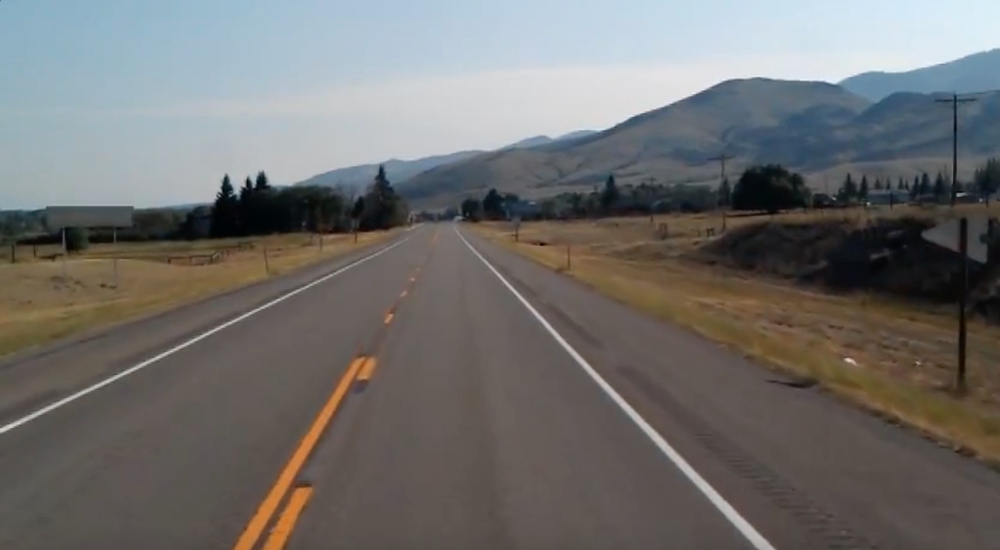

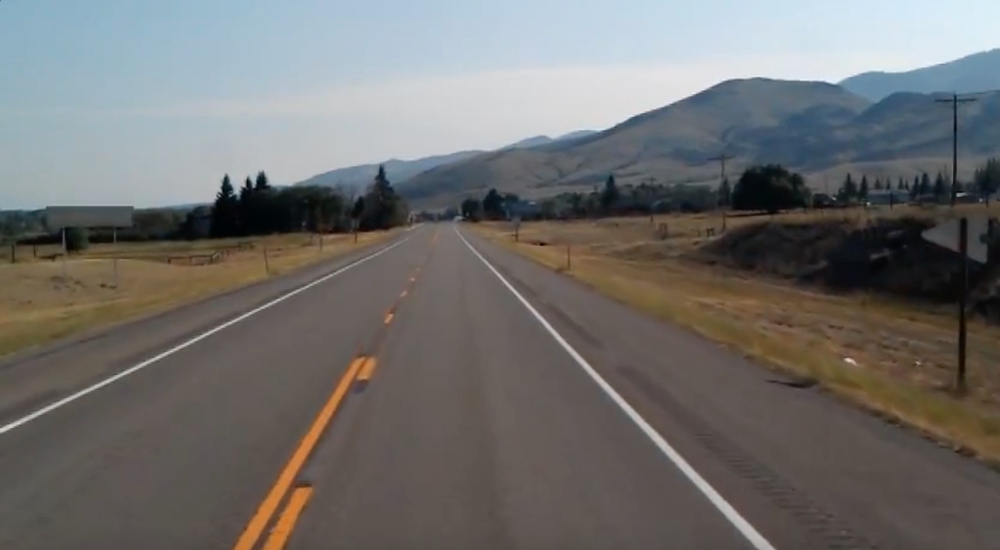

In [ ]:
image = cv2.imread('lane.jpg')
cv2_imshow(image)

### Step-1: Gray-Scaling

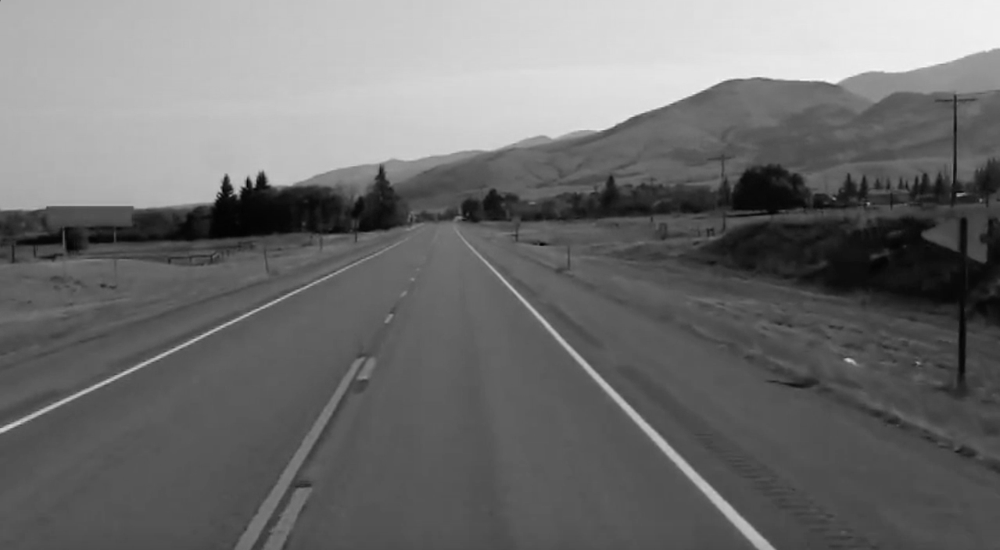

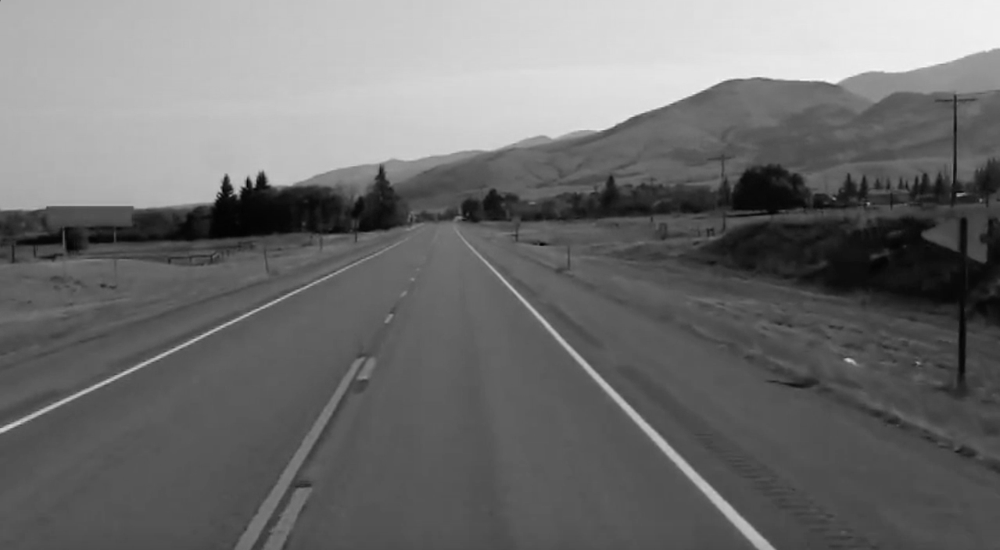

In [ ]:
image = cv2.imread('lane.jpg')
lane_image = np.copy(image) #creating copy of the image
gray = cv2.cvtColor(lane_image, cv2.COLOR_RGB2GRAY) #converting to gray-scale
cv2_imshow(gray)

### Step-2: Reduce Noise & Smoothen


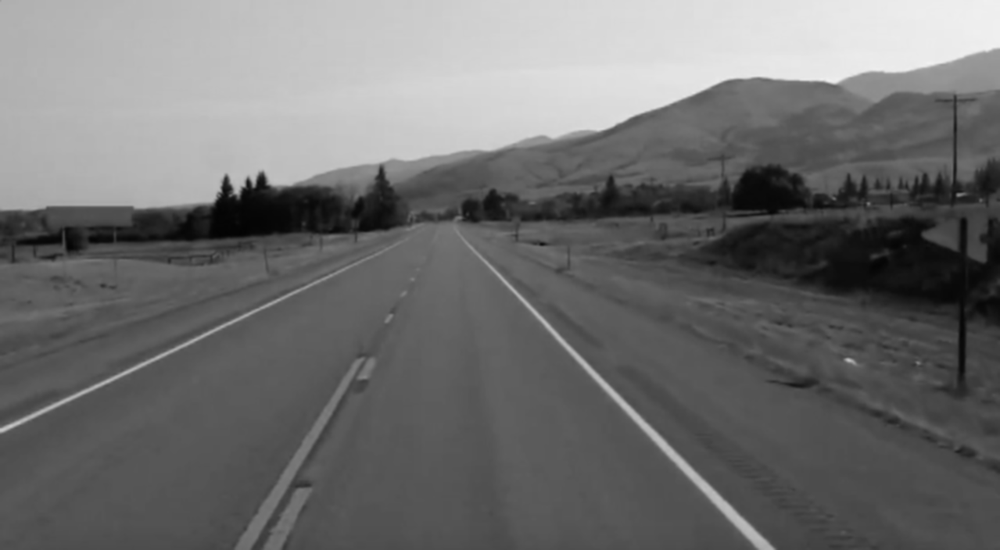

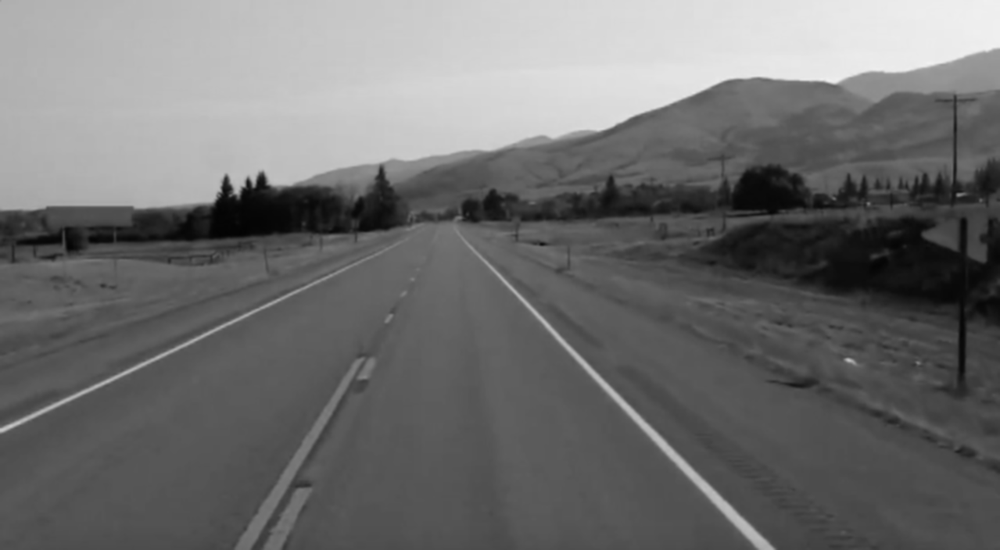

In [ ]:
image = cv2.imread('lane.jpg')
lane_image = np.copy(image)
gray = cv2.cvtColor(lane_image, cv2.COLOR_RGB2GRAY) 
blur = cv2.GaussianBlur(gray, (5, 5), 0)
cv2_imshow(blur)

### Step-3: Canny Method


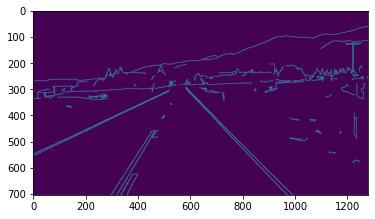

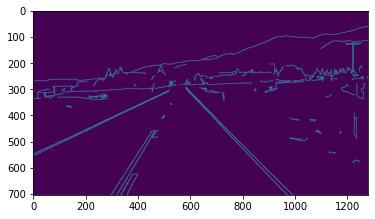

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def canny(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    blur = cv2.GaussianBlur(gray,(5, 5), 0)
    canny = cv2.Canny(blur, 50, 150)
    return canny
    
image = cv2.imread('lane.jpg')
lane_image = np.copy(image)
canny = cv2.Canny(lane_image, 50, 150) 
plt.imshow(canny)
plt.show()

In [ ]:
def display_lines(image, lines):
    line_image = np.zeros_like(image)
    if lines is not None:
        for x1, y1, x2, y2 in lines:
            cv2.line(line_image, (x1, y1), (x2, y2), (255, 0, 0), 10)
    return line_image

In [ ]:
def region_of_interest(image):
    height=image.shape[0]
    polygon=np.array([[(200,height),(1100,height),(550,250)]]) ##A triangle with bottem from 200 to 1100 and tip at (550,250)
    mask=np.zeros_like(image)
    cv2.fillPoly(mask,polygon,255)  ##put the triangle into a black background.
    masked_image=cv2.bitwise_and(image,mask)  ## trace the lanes into black background using masking
    return masked_image

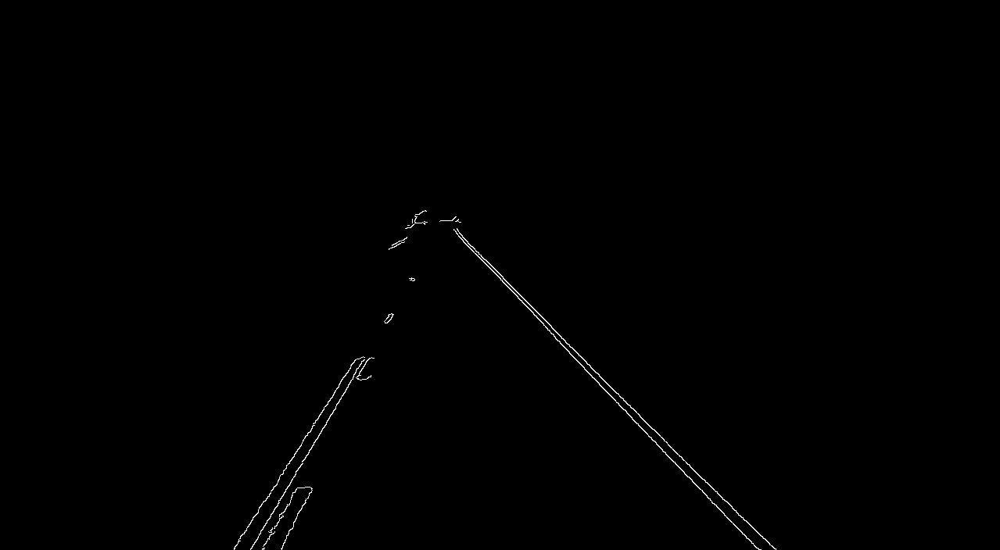

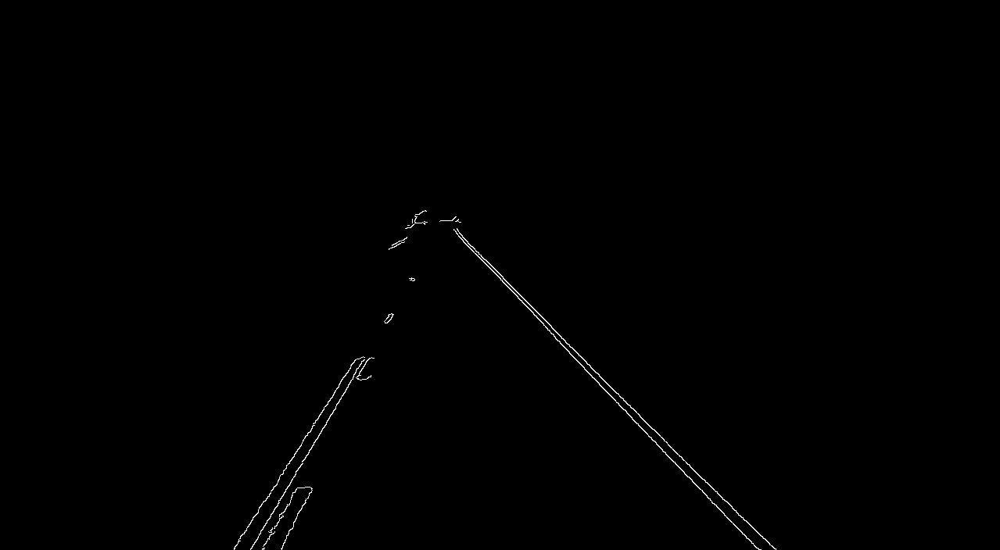

In [ ]:
cropped_image = region_of_interest(canny)
cv2_imshow(cropped_image)

make_coordinates: This will specify the coordinates for us to be able to mark the slope and y-intercept.

In [ ]:
def make_coordinates(image, line_parameters):
    slope, intercept = line_parameters
    y1 = image.shape[0]
    y2 = int(y1*(3/5))
    x1 = int((y1 - intercept)/slope)
    x2 = int((y2 - intercept)/slope)
    return np.array([x1, y1, x2, y2])

average_slope_intercept: we first declare two empty lists - left_fit and right_fit which will contain the coordinates of the average lines on the left and coordinates of the lines on the right respectively.

In [ ]:
def average_slope_intercept(image, lines):
    left_fit = []
    right_fit = []
    for line in lines:
        x1, y1, x2, y2 = line.reshape(4)
        parameters = np.polyfit((x1, x2), (y1, y2), 1)
        slope = parameters[0]
        intercept = parameters[1]
        if slope < 0:
            left_fit.append((slope, intercept))
        else:
            right_fit.append((slope, intercept))
    left_fit_average = np.average(left_fit, axis=0)
    right_fit_average = np.average(right_fit, axis=0)
    left_line = make_coordinates(image, left_fit_average)
    right_line = make_coordinates(image, right_fit_average)
    return np.array([left_line, right_line])

In [ ]:
lines = cv2.HoughLinesP(cropped_image, 2, np.pi/180, 100, np.array([]), minLineLength=40, maxLineGap=5)
averaged_lines = average_slope_intercept(image, lines)

Finally, we show the combo_image() where our lane lines are perfectly detected.



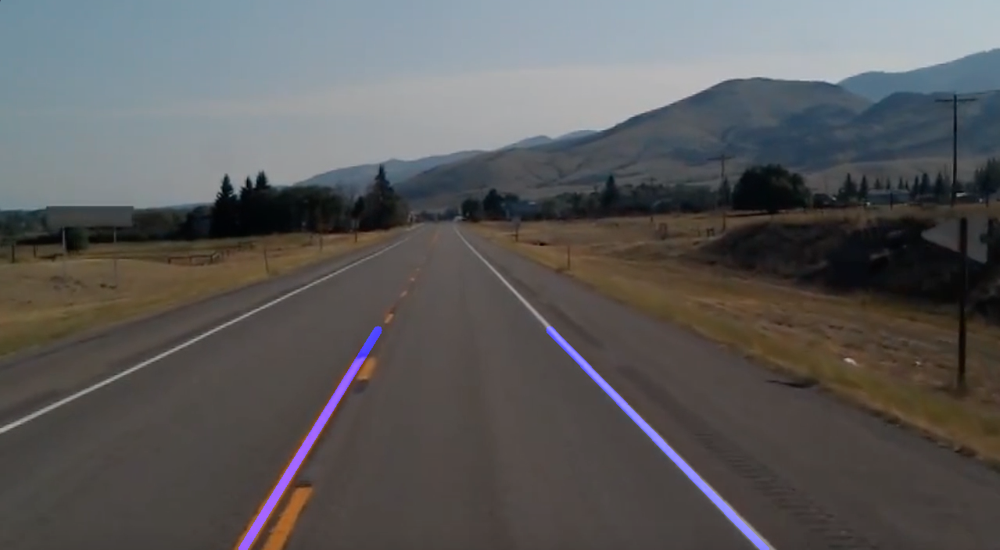

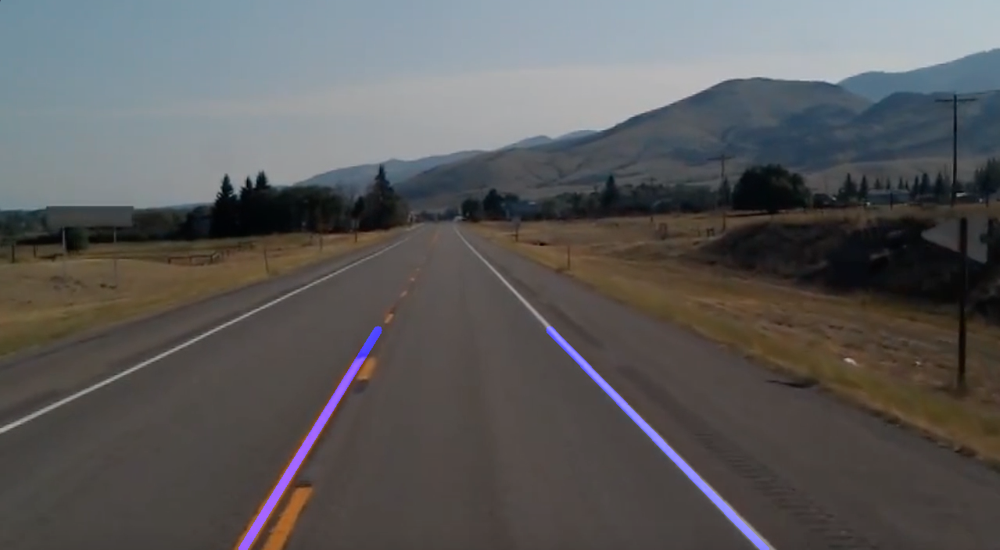

In [ ]:
line_image = display_lines(lane_image, averaged_lines)
combo_image = cv2.addWeighted(lane_image, 0.8, line_image, 1, 1)
cv2_imshow(combo_image)

## Load & Display The Video


In [ ]:
def make_coordinates(image, line_parameters):
    slope, intercept = line_parameters
    y1 = image.shape[0]
    y2 = int(y1*(3/5))
    x1 = int((y1 - intercept)/slope)
    x2 = int((y2 - intercept)/slope)
    return np.array([x1, y1, x2, y2])

In [ ]:
def average_slope_intercept(image, lines):
    left_fit = []
    right_fit = []
    for line in lines:
        x1, y1, x2, y2 = line.reshape(4)
        parameters = np.polyfit((x1, x2), (y1, y2), 1)
        slope = parameters[0]
        intercept = parameters[1]
        if slope < 0:
            left_fit.append((slope, intercept))
        else:
            right_fit.append((slope, intercept))
    left_fit_average = np.average(left_fit, axis=0)
    right_fit_average = np.average(right_fit, axis=0)
    left_line = make_coordinates(image, left_fit_average)
    right_line = make_coordinates(image, right_fit_average)
    return np.array([left_line, right_line])

In [ ]:
def canny(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    blur = cv2.GaussianBlur(gray,(5, 5), 0)
    canny = cv2.Canny(blur, 50, 150)
    return canny

In [ ]:
def display_lines(image, lines):
    line_image = np.zeros_like(image)
    if lines is not None:
        for x1, y1, x2, y2 in lines:
            cv2.line(line_image, (x1, y1), (x2, y2), (255, 0, 0), 10)
    return line_image

In [ ]:
def region_of_interest(image):
    height = image.shape[0]
    polygons = np.array([
    [(200, height), (1100, height), (550, 250)]
    ])
    mask = np.zeros_like(image)
    cv2.fillPoly(mask, polygons, 255)
    masked_image = cv2.bitwise_and(image, mask)
    return masked_image

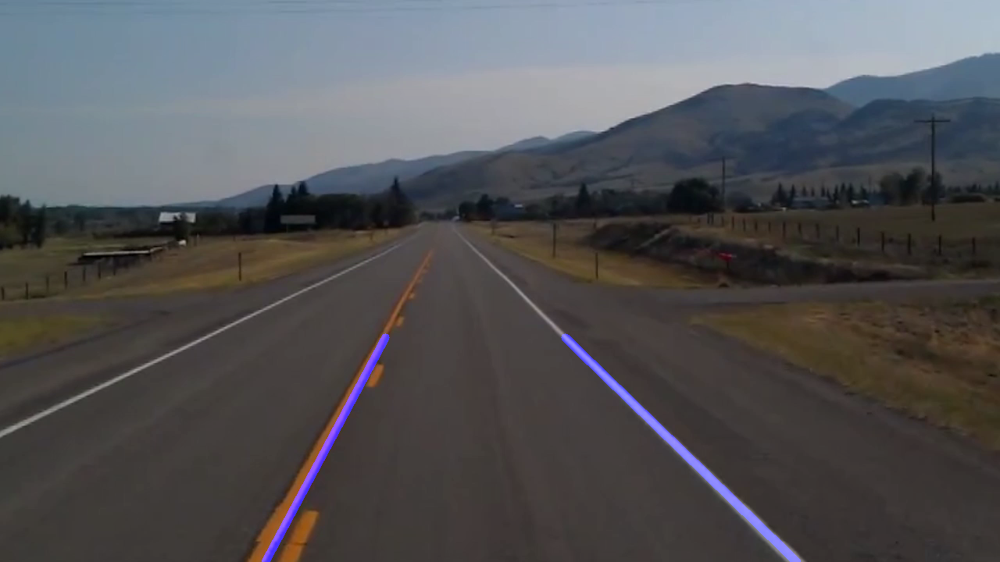

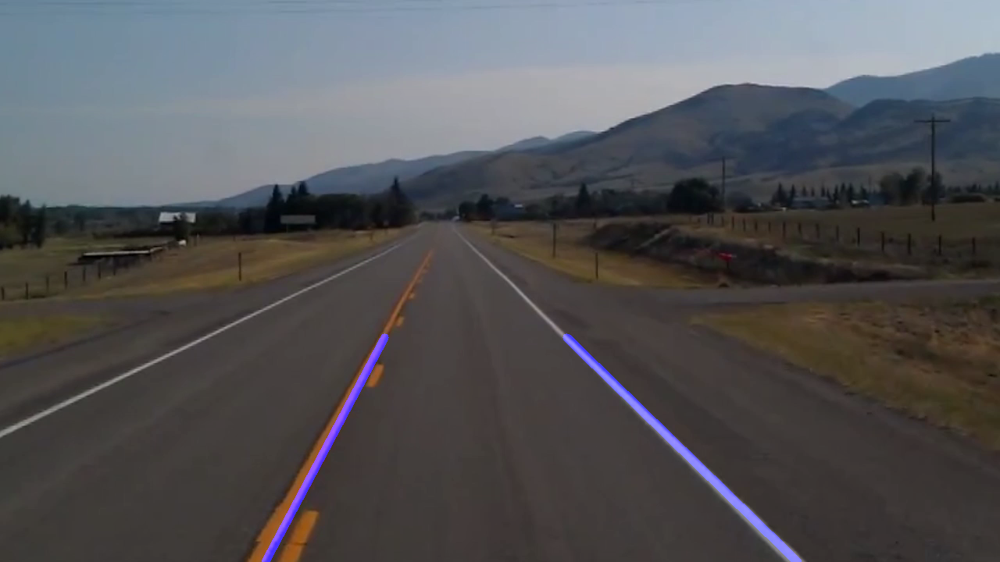

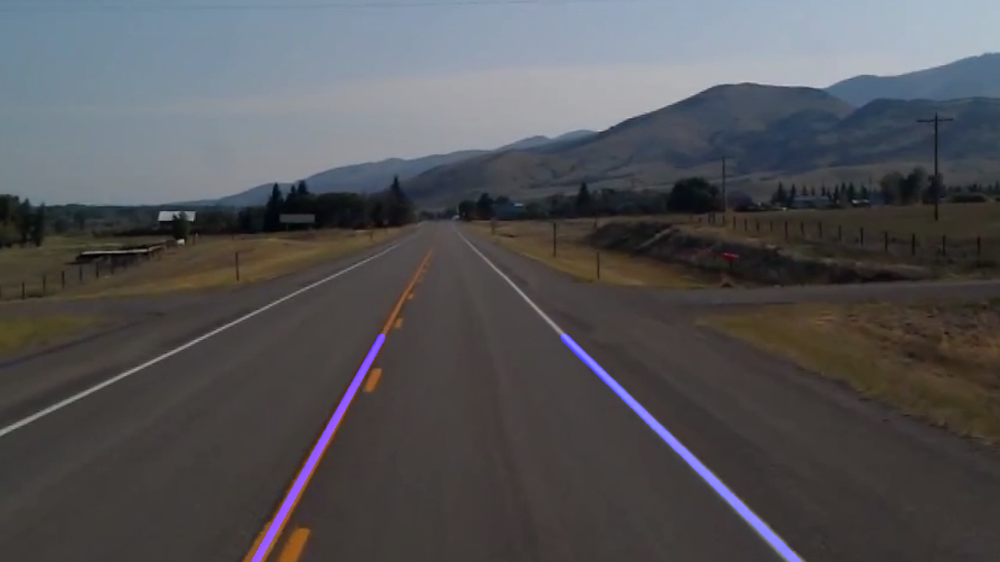

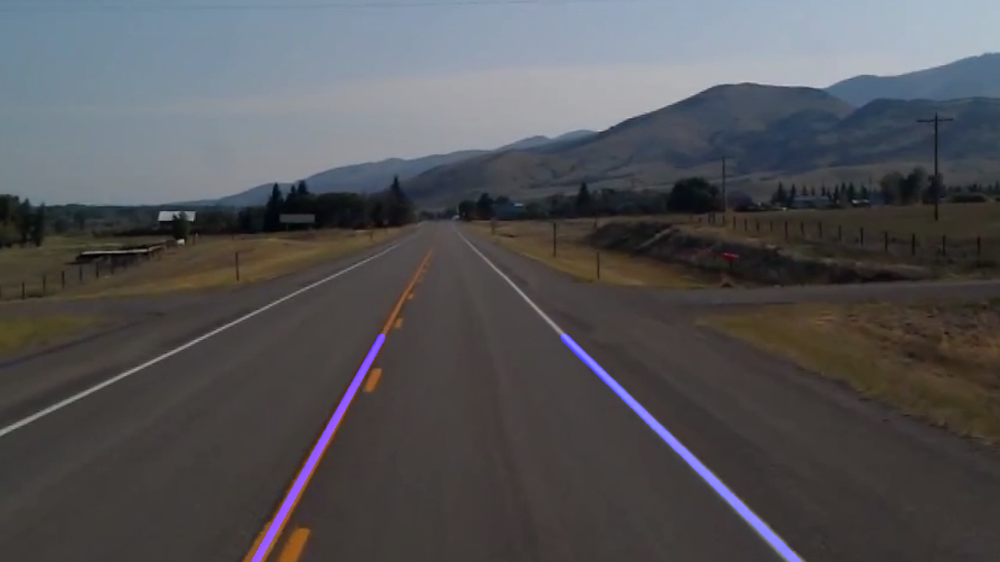

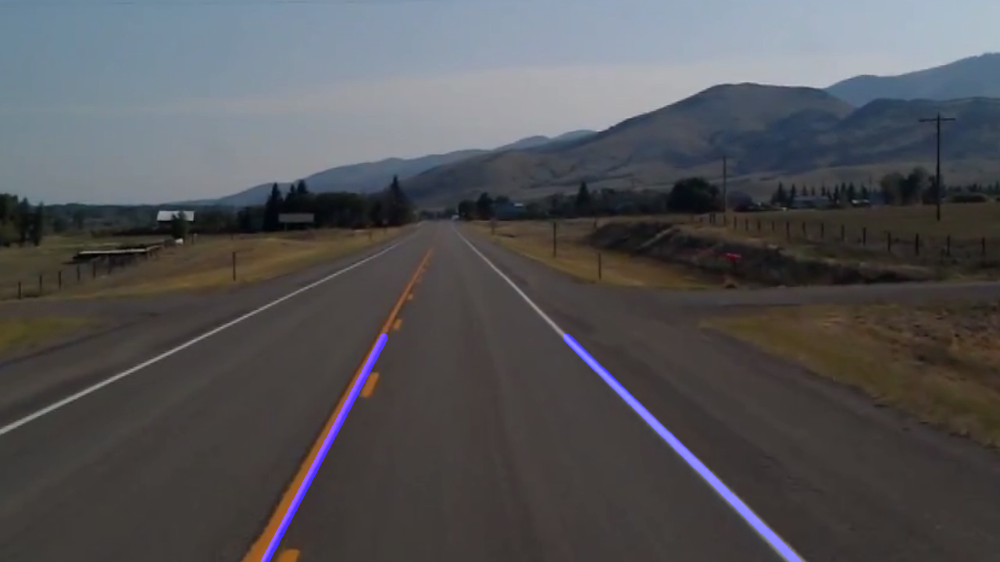

...

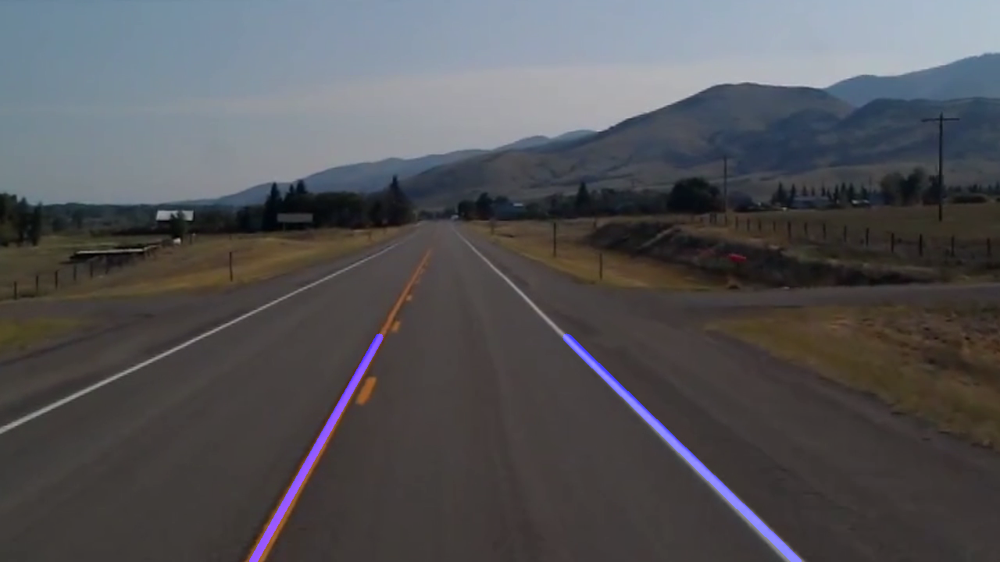

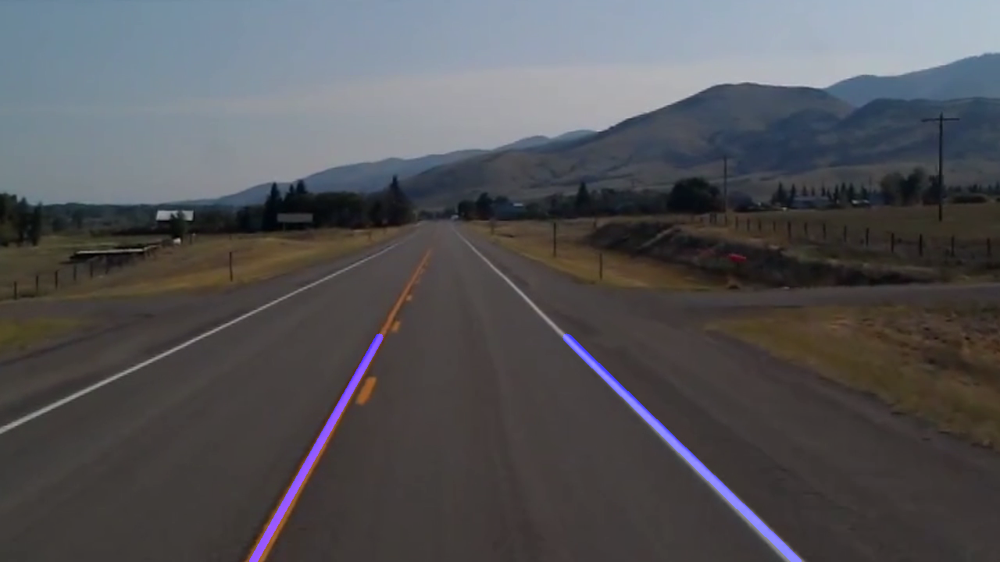

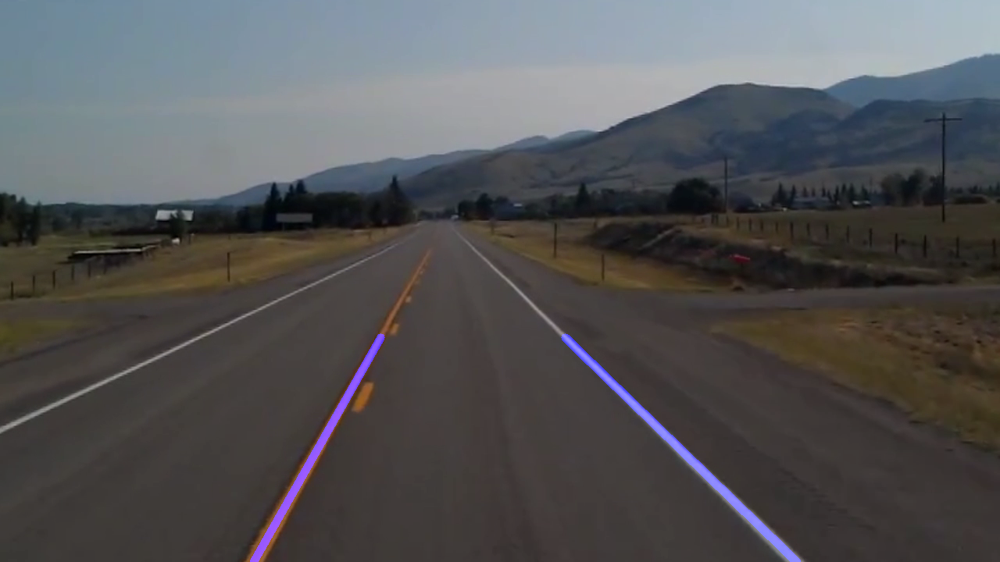

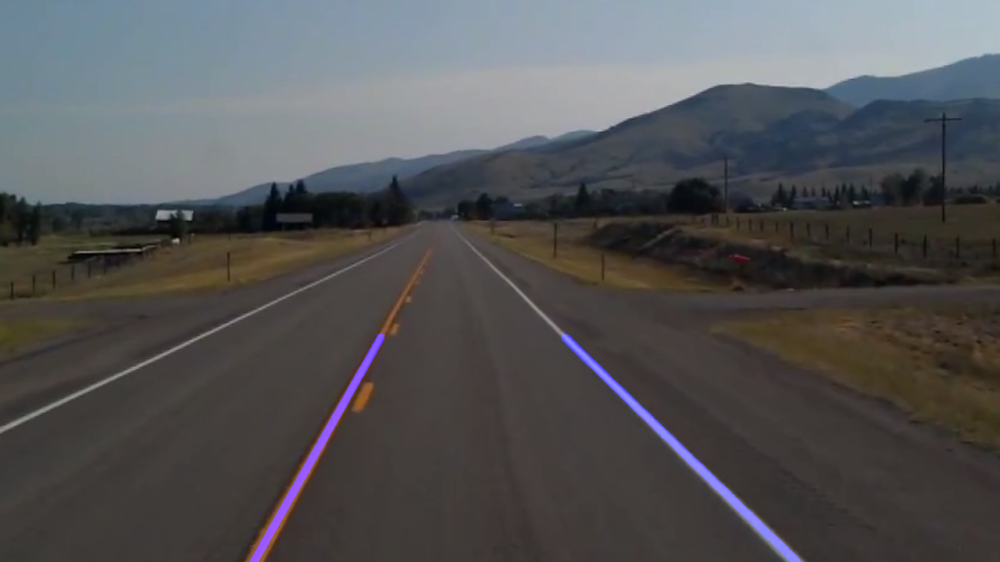

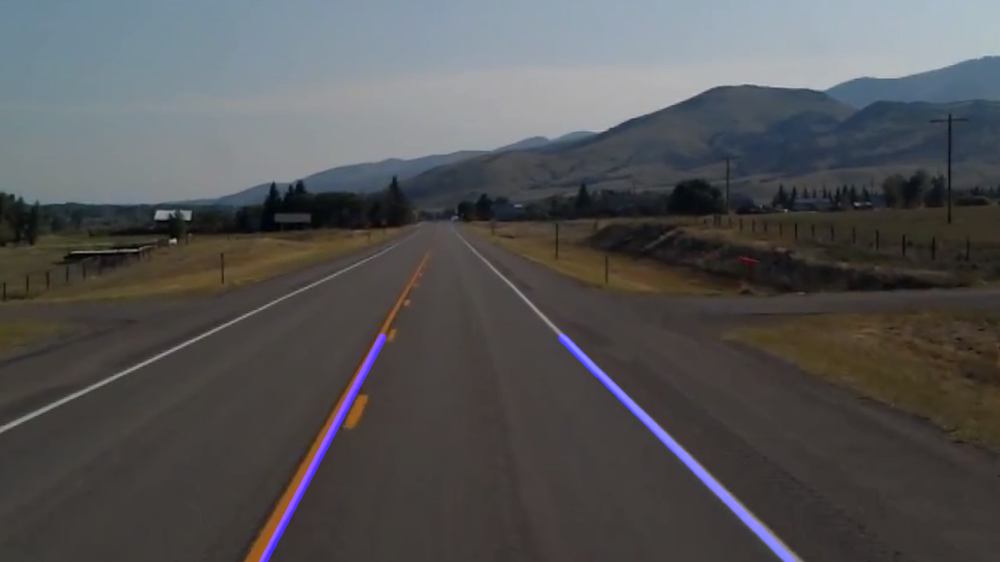

In [ ]:
cap = cv2.VideoCapture("test2.mp4")
for i in range(10): 
  cap.isOpened()
  _, frame = cap.read()
  canny_image = canny(frame)
  cropped_image = region_of_interest(canny_image)
  lines = cv2.HoughLinesP(cropped_image,2,np.pi/	180,100,np.array([]),minLineLength=40, maxLineGap=5)
  averaged_lines = average_slope_intercept(frame,lines)
  line_image = display_lines(frame,averaged_lines)
  combo_image = cv2.addWeighted(frame,0.8,line_image,1,1)
  cv2_imshow(combo_image)
  if cv2.waitKey(1) & 0xFF == ord('q'):
    break
cap.release()


# Ex8.2 
Test the model for other frames. Save the results.

Download the frames via this [link](https://drive.google.com/file/d/1e4cc4zFFna3Owyym6aq7ZXoquHA2l95O/view?usp=sharing)

Refer to this [article](https://www.analyticsvidhya.com/blog/2020/05/tutorial-real-time-lane-detection-opencv/) also


In [ ]:
import os
import re
import cv2
import numpy as np
from tqdm import tqdm_notebook
import matplotlib.pyplot as plt

In [ ]:
!gdown --id 1e4cc4zFFna3Owyym6aq7ZXoquHA2l95O

Downloading...
From: https://drive.google.com/uc?id=1e4cc4zFFna3Owyym6aq7ZXoquHA2l95O
To: /content/frames.zip
100% 132M/132M [00:01<00:00, 126MB/s]
Downloading...
From: https://drive.google.com/uc?id=1e4cc4zFFna3Owyym6aq7ZXoquHA2l95O
To: /content/frames.zip
100% 132M/132M [00:01<00:00, 127MB/s]


In [ ]:
import zipfile
with zipfile.ZipFile("frames.zip","r") as zf:
    zf.extractall('frames')
print(zf)

<zipfile.ZipFile [closed]>
<zipfile.ZipFile [closed]>


In [ ]:
from skimage.io import imread_collection

#your path 
col_dir = 'frames/content/drive/My Drive/Misc/road_detection/frames/*.png'

#creating a collection with the available images
col_images = imread_collection(col_dir)

In [ ]:
print(col_images)

['frames/content/drive/My Drive/Misc/road_detection/frames/0.png', 'frames/content/drive/My Drive/Misc/road_detection/frames/1.png', 'frames/content/drive/My Drive/Misc/road_detection/frames/2.png', 'frames/content/drive/My Drive/Misc/road_detection/frames/3.png', 'frames/content/drive/My Drive/Misc/road_detection/frames/4.png', 'frames/content/drive/My Drive/Misc/road_detection/frames/5.png', 'frames/content/drive/My Drive/Misc/road_detection/frames/6.png', 'frames/content/drive/My Drive/Misc/road_detection/frames/7.png', 'frames/content/drive/My Drive/Misc/road_detection/frames/8.png', 'frames/content/drive/My Drive/Misc/road_detection/frames/9.png', 'frames/content/drive/My Drive/Misc/road_detection/frames/10.png', 'frames/content/drive/My Drive/Misc/road_detection/frames/11.png', 'frames/content/drive/My Drive/Misc/road_detection/frames/12.png', 'frames/content/drive/My Drive/Misc/road_detection/frames/13.png', 'frames/content/drive/My Drive/Misc/road_detection/frames/14.png', 'fra

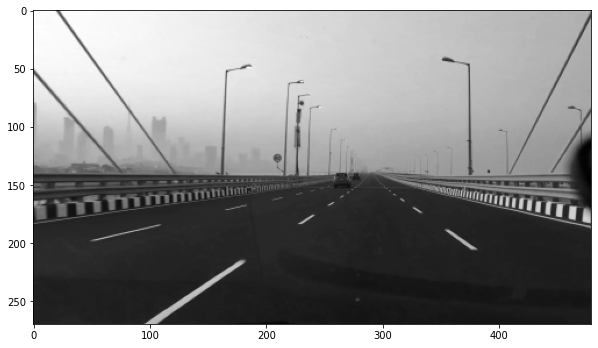

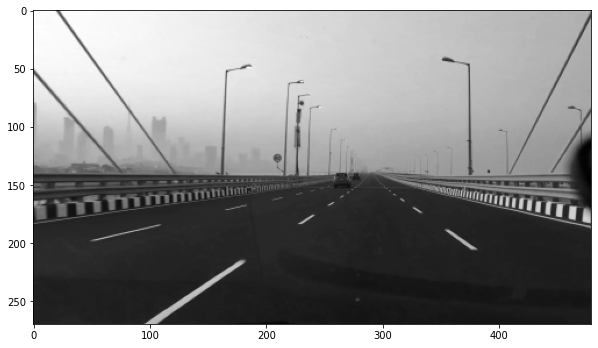

In [ ]:
# specify frame index
idx = 457

# plot frame
plt.figure(figsize=(10,10))
plt.imshow(col_images[idx][:,:,0], cmap= "gray")
plt.show()

In [ ]:
# create a zero array
stencil = np.zeros_like(col_images[idx][:,:,0])

# specify coordinates of the polygon
polygon = np.array([[50,270], [220,160], [360,160], [480,270]])

# fill polygon with ones
cv2.fillConvexPoly(stencil, polygon, 1)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 1, 1, 0],
       [0, 0, 0, ..., 1, 1, 1]], dtype=uint8)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 1, 1, 0],
       [0, 0, 0, ..., 1, 1, 1]], dtype=uint8)

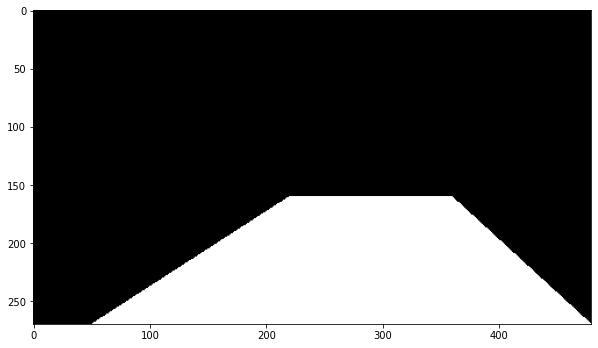

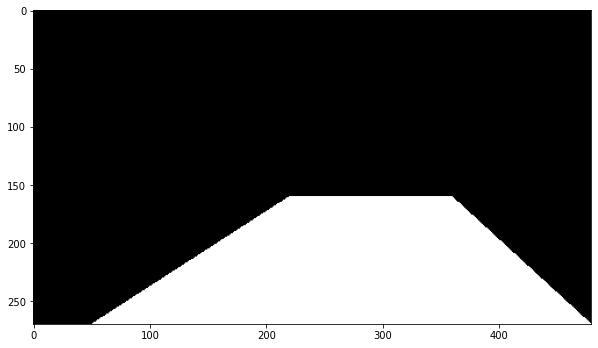

In [ ]:
# plot polygon
plt.figure(figsize=(10,10))
plt.imshow(stencil, cmap= "gray")
plt.show()

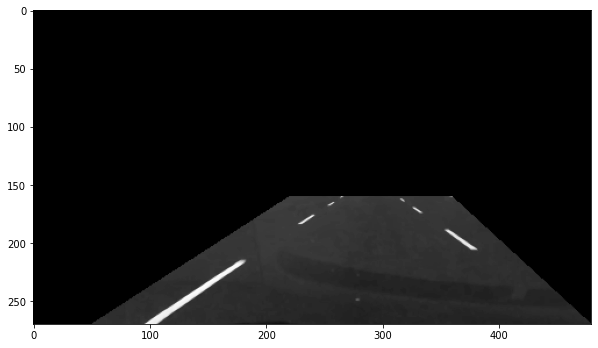

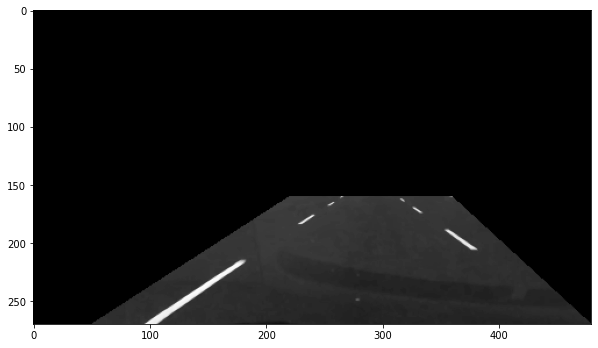

In [ ]:
# apply polygon as a mask on the frame
img = cv2.bitwise_and(col_images[idx][:,:,0], col_images[idx][:,:,0], mask=stencil)

# plot masked frame
plt.figure(figsize=(10,10))
plt.imshow(img, cmap= "gray")
plt.show()

## Image Thresholding


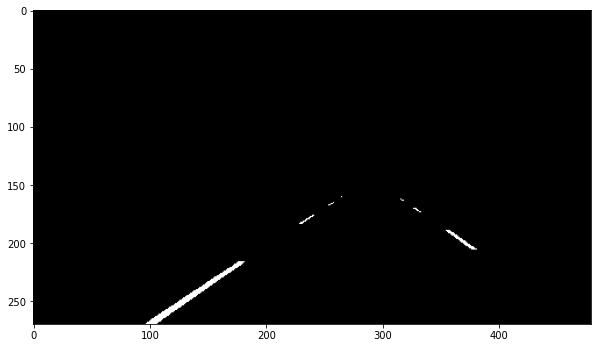

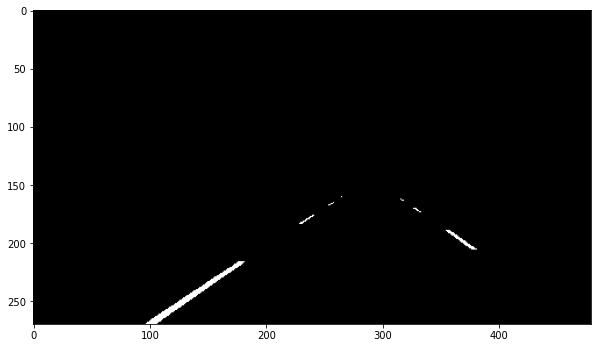

In [ ]:
# apply image thresholding
ret, thresh = cv2.threshold(img, 130, 145, cv2.THRESH_BINARY)

# plot image
plt.figure(figsize=(10,10))
plt.imshow(thresh, cmap= "gray")
plt.show()

## Hough Line Transformation

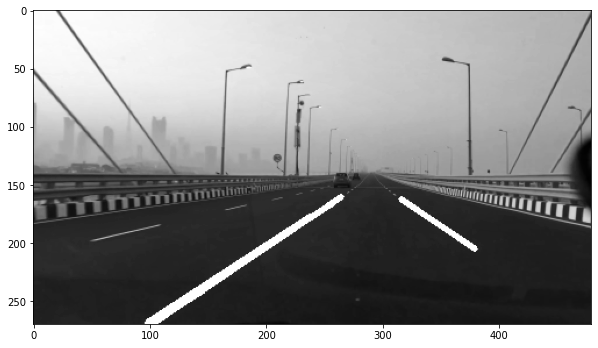

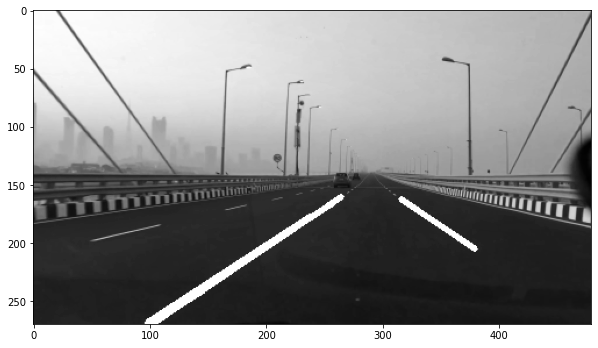

In [ ]:
lines = cv2.HoughLinesP(thresh, 1, np.pi/180, 30, maxLineGap=200)

# create a copy of the original frame
dmy = col_images[idx][:,:,0].copy()

# draw Hough lines
for line in lines:
  x1, y1, x2, y2 = line[0]
  cv2.line(dmy, (x1, y1), (x2, y2), (255, 0, 0), 3)

# plot frame
plt.figure(figsize=(10,10))
plt.imshow(dmy, cmap= "gray")
plt.show()

In [ ]:
cnt = 0

for img in tqdm_notebook(col_images):
  
  # apply frame mask
  masked = cv2.bitwise_and(img[:,:,0], img[:,:,0], mask=stencil)
  
  # apply image thresholding
  ret, thresh = cv2.threshold(masked, 130, 145, cv2.THRESH_BINARY)

  # apply Hough Line Transformation
  lines = cv2.HoughLinesP(thresh, 1, np.pi/180, 30, maxLineGap=200)
  dmy = img.copy()
  
  # Plot detected lines
  try:
    for line in lines:
      x1, y1, x2, y2 = line[0]
      cv2.line(dmy, (x1, y1), (x2, y2), (255, 0, 0), 3)
  
    cv2.imwrite('detected/'+str(cnt)+'.png',dmy)
  
  except TypeError: 
    cv2.imwrite('detected/'+str(cnt)+'.png',img)

  cnt+= 1

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


  0%|          | 0/1108 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


  0%|          | 0/1108 [00:00<?, ?it/s]

In [ ]:
# input frames path
pathIn= 'frames/content/drive/My Drive/Misc/road_detection/frames/'

# output path to save the video
pathOut = 'roads_v2.mp4'

# specify frames per second
fps = 30.0

In [ ]:
from os.path import isfile, join

# get file names of the frames
files = [f for f in os.listdir(pathIn) if isfile(join(pathIn, f))]
files.sort(key=lambda f: int(re.sub('\D', '', f)))

In [ ]:
frame_list = []

for i in tqdm_notebook(range(len(files))):
    filename=pathIn + files[i]
    #reading each files
    img = cv2.imread(filename)
    height, width, layers = img.shape
    size = (width,height)
    
    #inserting the frames into an image array
    cv2_imshow(img)
    frame_list.append(img)

In [ ]:
# write the video
out = cv2.VideoWriter(pathOut,cv2.VideoWriter_fourcc(*'DIVX'), fps, size)

for i in range(len(frame_list)):
    # writing to a image array
    out.write(frame_list[i])

out.release()